In [1]:
import IPython
IPython.display.clear_output()

In [2]:
! pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 30.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
jupyterlab 4.2.1 requires jupyter-lsp>=2.0.0, but you h

# Import Dataset from RoboFlow

In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="yxDzggVH7TK7uPd1bwnc")
project = rf.workspace("anndev").project("hospitalequipmentdetection")
version = project.version(7)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to HospitalEquipmentDetection--7 in yolov5pytorch:: 100%|██████████| 9127/9127 [00:02<00:00, 3211.27it/s]


In [4]:
dataset_dir = "/kaggle/working/HospitalEquipmentDetection--7"

# Import Libraries

In [5]:
import os
import glob
import numpy as np
import cv2 
import random
import sys
import matplotlib.pyplot as plt 
import requests
import pickle as pkl
import shutil
%matplotlib inline

np.random.seed(42)

# Visualize Images

Before moving forward, let's check out few of the labelled images.

In [6]:
class_names = ['anesthesia-machine', 'c-arm', 'crash-cart', 'ct-scanner', 'defibrillators', 'ecg-machine', 'hemodialysis-machine', 'hospital-bed', 'infusion-pump', 'oxygen-concentrator', 'patient-monitor', 'radiotherapy-equipment', 'robotic-surgery-system', 'suction-machine', 'ultrsound-machine', 'ventilator', 'wheel-chair', 'x-ray-machine']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [7]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [8]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        )

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [9]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)

        print(f"Processing image: {all_training_images[j]}")
        print(f"Label file: {all_training_labels[j]}")

        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:

                parts = label_line.strip().split(' ')
                label = parts[0]
                x_c, y_c, w, h = parts[1:5]

                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(int(label))


            print(f"Labels: {labels}")
            print(f"Bboxes: {bboxes}")
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

Processing image: /kaggle/working/HospitalEquipmentDetection--7/train/images/crash_cart_24_png.rf.c09b0eec5244780c0c5e936a592f451e.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train/labels/crash_cart_24_png.rf.c09b0eec5244780c0c5e936a592f451e.txt
Labels: [2]
Bboxes: [[0.48907, 0.49554000000000004, 0.73734, 0.95027]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train/images/ultrasound_machine_84_png.rf.699f6753e3805b1e063b2c3d4dff0f1f.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train/labels/ultrasound_machine_84_png.rf.699f6753e3805b1e063b2c3d4dff0f1f.txt
Labels: [14]
Bboxes: [[0.42915625, 0.5, 0.6569843750000001, 1.0]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train/images/c_arm_22_png.rf.4d6f8ec4fb928a0695052b9f706f8c7a.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train/labels/c_arm_22_png.rf.4d6f8ec4fb928a0695052b9f706f8c7a.txt
Labels: [1]
Bboxes: [[0.4944416666666667, 0.49324999999999997, 0.

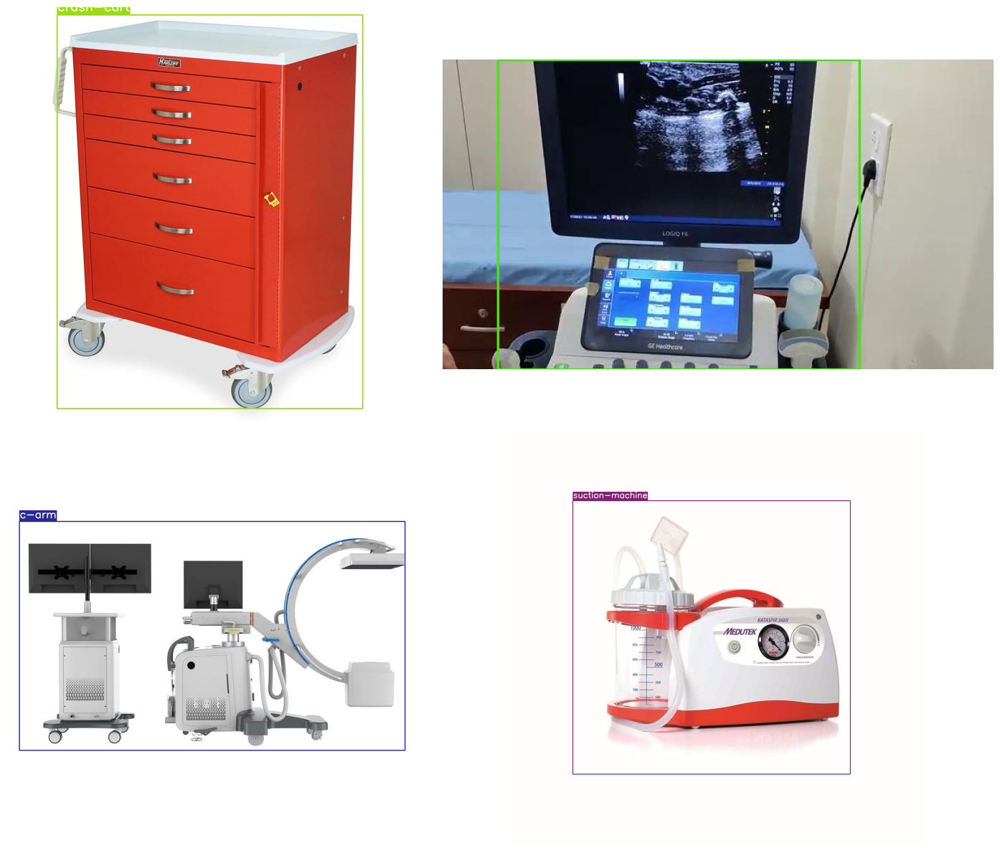

In [10]:
plot(
    image_paths='/kaggle/working/HospitalEquipmentDetection--7/train/images/*',
    label_paths='/kaggle/working/HospitalEquipmentDetection--7/train/labels/*',
    num_samples=4,
)

# Data Preprocessing

In [11]:
class RandomHorizontalFlip(object):
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, img, bboxes):
        if random.random() < self.p:
            img = img[:, ::-1, :]
            img_w = img.shape[1]
            
            for i in range(len(bboxes)):
                # For YOLO format, x_center is in the range [0, 1], so we need to flip it
                bboxes[i][1] = 1 - bboxes[i][1]
            
        return img, bboxes

In [12]:
def read_txt_labels(txt_file_path):
    with open(txt_file_path, 'r') as f:
        lines = f.readlines()
    bboxes = []
    
    for line in lines:
        parts = line.strip().split(' ') #
        classid = parts[0]
        x_c, y_c, w, h = parts[1:5]
        
        x_c = float(x_c)
        y_c = float(y_c)
        w = float(w)
        h = float(h)
        
        bboxes.append([classid, x_c, y_c, w, h])
        #labels.append(int(label))
                
        #bbox = list(map(float, line.strip().split()))
        #bboxes.append(bbox)
    return bboxes

In [13]:
def save_txt_labels(bboxes, txt_file_path):
    with open(txt_file_path, 'w') as f:
        for bbox in bboxes:
            f.write(' '.join(map(str, bbox)) + '\n')

In [14]:
def flip_and_save_images(image_dir, label_dir, output_img_dir, output_label_dir, augmentation):
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_label_dir, exist_ok=True)

    for img_file in os.listdir(image_dir):
        if img_file.endswith('.jpg'):
            img_path = os.path.join(image_dir, img_file)
            base_name = img_file.rsplit('.', 1)[0]
            label_file = base_name + '.txt'
            label_path = os.path.join(label_dir, label_file)

            if os.path.exists(label_path):
                img = cv2.imread(img_path)
                bboxes = read_txt_labels(label_path)

                aug_img, aug_bboxes = augmentation(img, bboxes)

                aug_img_path = os.path.join(output_img_dir, base_name + '_flipped.jpg')
                aug_label_path = os.path.join(output_label_dir, base_name + '_flipped.txt')

                cv2.imwrite(aug_img_path, aug_img)
                save_txt_labels(aug_bboxes, aug_label_path)
            else:
                print(f"No label file found for {img_file}")

In [15]:
train_images_dir = os.path.join(dataset_dir, 'train', 'images')
train_labels_dir = os.path.join(dataset_dir, 'train', 'labels')

In [16]:
output_images_dir = os.path.join(dataset_dir, 'train_aug', 'images')
output_labels_dir = os.path.join(dataset_dir, 'train_aug', 'labels')

In [17]:
augmentation = RandomHorizontalFlip(p=1.0)
flip_and_save_images(train_images_dir, train_labels_dir, output_images_dir, output_labels_dir, augmentation)


In [18]:
val_images_dir = os.path.join(dataset_dir, 'valid', 'images')
val_labels_dir = os.path.join(dataset_dir, 'valid', 'labels')


In [19]:
output_images_dir = os.path.join(dataset_dir, 'val_aug', 'images')
output_labels_dir = os.path.join(dataset_dir, 'val_aug', 'labels')


In [20]:
augmentation = RandomHorizontalFlip(p=1.0)
flip_and_save_images(val_images_dir, val_labels_dir, output_images_dir, output_labels_dir, augmentation)


In [21]:
train_flip_images_dir = os.path.join(dataset_dir, 'train_aug', 'images')
train_flip_labels_dir = os.path.join(dataset_dir, 'train_aug', 'labels')
val_flip_images_dir = os.path.join(dataset_dir, 'val_aug', 'images')
val_flip_labels_dir = os.path.join(dataset_dir, 'val_aug', 'labels')

Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/hospital_bed_160_png.rf.57342c25a4d28f7558fc0fe401ba9c7a_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/hospital_bed_160_png.rf.57342c25a4d28f7558fc0fe401ba9c7a_flipped.txt
Labels: [7]
Bboxes: [[0.5632395833333332, 0.6761574074074074, 0.6464427083333334, 0.6476851851851851]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/ecg_machine_8_png.rf.5d7791fb33a64ac47c5b54dd344b3595_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/ecg_machine_8_png.rf.5d7791fb33a64ac47c5b54dd344b3595_flipped.txt
Labels: [5]
Bboxes: [[0.5849753694581281, 0.4527777777777778, 0.8300492610837439, 0.9055555555555556]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/x_ray_machine_47_png.rf.4bbd1b0f9124f2c1370918c7141e0115_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/trai

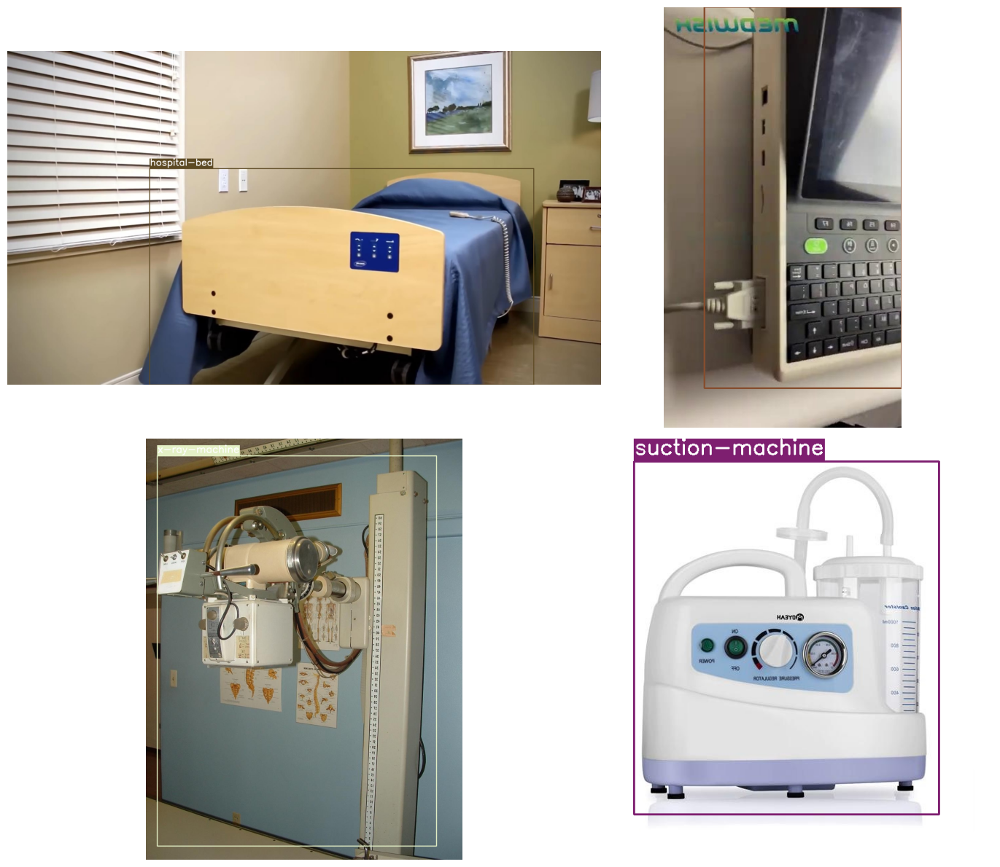

In [22]:
plot(
    image_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/images/*', #change the paths
    label_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/*', #change the paths
    num_samples=4,
)

In [23]:
def count_files_in_directory(directory, extension):
    return len([f for f in os.listdir(directory) if f.endswith(extension)])


In [24]:
train_flip_images_count = count_files_in_directory(train_flip_images_dir, '.jpg')
train_flip_labels_count = count_files_in_directory(train_flip_labels_dir, '.txt')
val_flip_images_count = count_files_in_directory(val_flip_images_dir, '.jpg')
val_flip_labels_count = count_files_in_directory(val_flip_labels_dir, '.txt')

In [25]:
print(f"Train flipped Images: {train_flip_images_count}")
print(f"Train flipped Labels: {train_flip_labels_count}")
print(f"Validation flipped Images: {val_flip_images_count}")
print(f"Validation flipped Labels: {val_flip_labels_count}")

Train flipped Images: 3646
Train flipped Labels: 3646
Validation flipped Images: 913
Validation flipped Labels: 913


Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/oxygen_concentrator_130_png.rf.697bdd119f3636471b49a1222cd11458_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/oxygen_concentrator_130_png.rf.697bdd119f3636471b49a1222cd11458_flipped.txt
Labels: [9]
Bboxes: [[0.5139245667686034, 0.5096153846153846, 0.7927522935779817, 0.9807692307692307]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/ultrasound_machine_192_png.rf.dc957925d7bec8acdabc0fae9d8da7bb_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/ultrasound_machine_192_png.rf.dc957925d7bec8acdabc0fae9d8da7bb_flipped.txt
Labels: [14]
Bboxes: [[0.5116375, 0.50035, 0.4257125, 0.9297124999999999]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/defibrillator_39_png.rf.bb5b1f45f4e6c498f5ddb3e28ebb54cb_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/

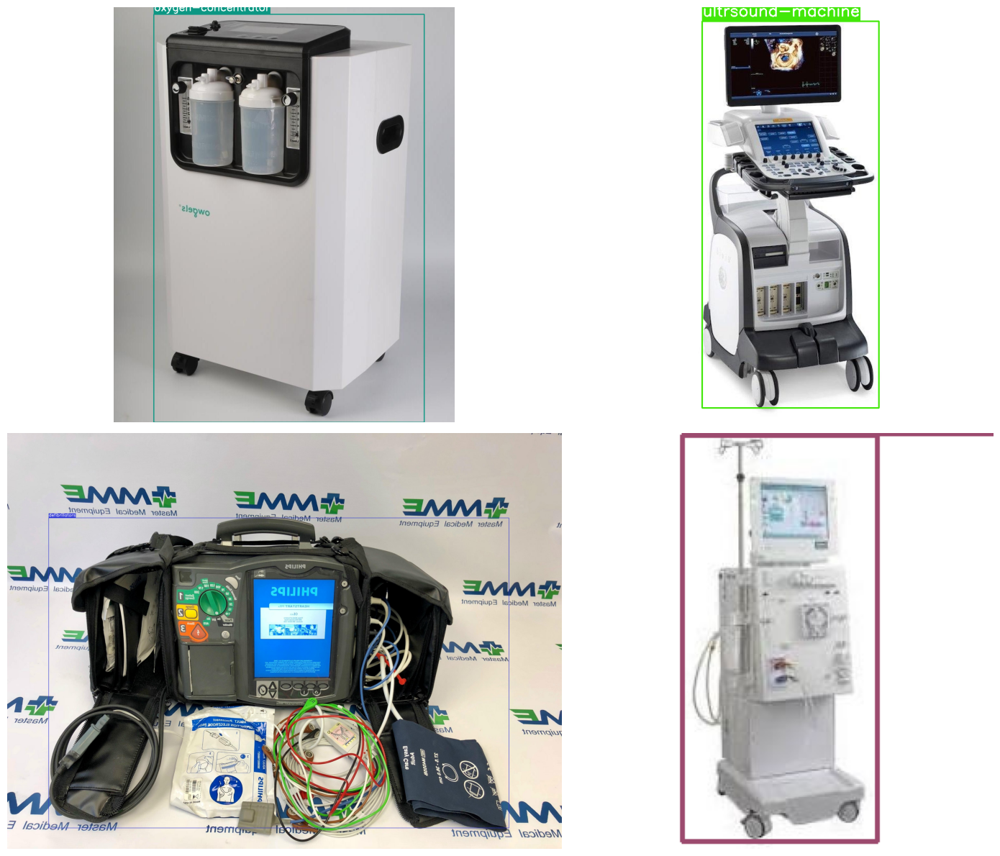

In [26]:
plot(
    image_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/images/*', #change the paths
    label_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/*', #change the paths
    num_samples=4,
)

In [27]:
class RandomHSV(object):
    
    def __init__(self, hue=None, saturation=None, brightness=None):
        self.hue = hue if hue else 0
        self.saturation = saturation if saturation else 0
        self.brightness = brightness if brightness else 0
        
        if type(self.hue) != tuple:
            self.hue = (-self.hue, self.hue)
            
        if type(self.saturation) != tuple:
            self.saturation = (-self.saturation, self.saturation)
        
        if type(self.brightness) != tuple:
            self.brightness = (-self.brightness, self.brightness)
    
    def __call__(self, img, bboxes):
        hue = random.randint(*self.hue)
        saturation = random.randint(*self.saturation)
        brightness = random.randint(*self.brightness)
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(int)
        
        img[:, :, 0] += hue
        img[:, :, 1] += saturation
        img[:, :, 2] += brightness
        
        img[:, :, 0] = np.clip(img[:, :, 0], 0, 179)
        img[:, :, 1] = np.clip(img[:, :, 1], 0, 255)
        img[:, :, 2] = np.clip(img[:, :, 2], 0, 255)
        
        img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_HSV2BGR)
        
        return img, bboxes

In [28]:
def read_txt_labels(label_path):
    with open(label_path, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])
        bboxes.append([class_id, x_center, y_center, width, height])
    return np.array(bboxes)

In [29]:
def save_txt_labels(bboxes, label_path):
    with open(label_path, 'w') as file:
        for bbox in bboxes:
            class_id = int(bbox[0])
            x_center, y_center, width, height = bbox[1:5]
            file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")


In [30]:
def hsv_and_save_images(image_dir, label_dir, output_img_dir, output_label_dir, hsv_params):
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_label_dir, exist_ok=True)
    for img_file in os.listdir(image_dir):
        if img_file.endswith('.jpg'):
            img_path = os.path.join(image_dir, img_file)
            base_name = img_file.rsplit('.', 1)[0]
            label_file = base_name + '.txt'
            label_path = os.path.join(label_dir, label_file)
            if os.path.exists(label_path):
                img = cv2.imread(img_path)
                bboxes = read_txt_labels(label_path)
                if bboxes.size == 0:
                    continue
                hsv_adjust = RandomHSV(*hsv_params)
                aug_img, aug_bboxes = hsv_adjust(img, bboxes)
                aug_img_path = os.path.join(output_img_dir, f"{base_name}_hsv.jpg")
                aug_label_path = os.path.join(output_label_dir, f"{base_name}_hsv.txt")
                cv2.imwrite(aug_img_path, aug_img)
                save_txt_labels(aug_bboxes, aug_label_path)
            else:
                print(f"No label file found for {img_file}")

In [31]:
train_hsv_images_dir = os.path.join(dataset_dir, 'train_aug', 'images')
train_hsv_labels_dir = os.path.join(dataset_dir, 'train_aug', 'labels')
val_hsv_images_dir = os.path.join(dataset_dir, 'val_aug', 'images')
val_hsv_labels_dir = os.path.join(dataset_dir, 'val_aug', 'labels')

In [32]:
hsv_params = (10, (-50, 0), (-100, -50))

In [33]:
hsv_and_save_images(train_images_dir, train_labels_dir, train_hsv_images_dir, train_hsv_labels_dir, hsv_params)


In [34]:
hsv_and_save_images(val_images_dir, val_labels_dir, val_hsv_images_dir, val_hsv_labels_dir, hsv_params)


In [35]:
train_hsv_images_dir = os.path.join(dataset_dir, 'train_aug', 'images')
train_hsv_labels_dir = os.path.join(dataset_dir, 'train_aug', 'labels')
val_hsv_images_dir = os.path.join(dataset_dir, 'val_aug', 'images')
val_hsv_labels_dir = os.path.join(dataset_dir, 'val_aug', 'labels')

In [36]:
train_hsv_images_count = count_files_in_directory(train_hsv_images_dir, '.jpg')
train_hsv_labels_count = count_files_in_directory(train_hsv_labels_dir, '.txt')
val_hsv_images_count = count_files_in_directory(val_hsv_images_dir, '.jpg')
val_hsv_labels_count = count_files_in_directory(val_hsv_labels_dir, '.txt')


In [37]:
print(f"Train hsv Images: {train_hsv_images_count}")
print(f"Train hsv Labels: {train_hsv_labels_count}")
print(f"Validation hsv Images: {val_hsv_images_count}")
print(f"Validation hsv Labels: {val_hsv_labels_count}")

Train hsv Images: 7291
Train hsv Labels: 7291
Validation hsv Images: 1826
Validation hsv Labels: 1826


In [38]:
def copy_files(src_dir, dst_dir):
    if not os.path.exists(dst_dir):
        os.makedirs(dst_dir)
    for filename in os.listdir(src_dir):
        src_file = os.path.join(src_dir, filename)
        dst_file = os.path.join(dst_dir, filename)
        shutil.copyfile(src_file, dst_file)

In [39]:
def copy_images_and_labels(train_images_dir, train_labels_dir, output_images_dir, output_labels_dir):
    copy_files(train_images_dir, output_images_dir)
    copy_files(train_labels_dir, output_labels_dir)


In [40]:
train_images_dir = os.path.join(dataset_dir, 'train', 'images')
train_labels_dir = os.path.join(dataset_dir, 'train', 'labels')
output_train_images_dir = os.path.join(dataset_dir, 'train_aug', 'images')
output_train_labels_dir = os.path.join(dataset_dir, 'train_aug', 'labels')

In [41]:
val_images_dir = os.path.join(dataset_dir, 'valid', 'images')
val_labels_dir = os.path.join(dataset_dir, 'valid', 'labels')
output_val_images_dir = os.path.join(dataset_dir, 'val_aug', 'images')
output_val_labels_dir = os.path.join(dataset_dir, 'val_aug', 'labels')

In [42]:
copy_images_and_labels(train_images_dir, train_labels_dir, output_train_images_dir, output_train_labels_dir)

In [43]:
copy_images_and_labels(val_images_dir, val_labels_dir, output_val_images_dir, output_val_labels_dir)

In [44]:
train_aug_images_count = count_files_in_directory(output_train_images_dir, '.jpg')
train_aug_labels_count = count_files_in_directory(output_train_labels_dir, '.txt')
val_aug_images_count = count_files_in_directory(output_val_images_dir, '.jpg')
val_aug_labels_count = count_files_in_directory(output_val_labels_dir, '.txt')

In [45]:
print(f"Train aug Images: {train_aug_images_count}")
print(f"Train aug Labels: {train_aug_labels_count}")
print(f"Validation aug Images: {val_aug_images_count}")
print(f"Validation aug Labels: {val_aug_labels_count}")

Train aug Images: 10937
Train aug Labels: 10937
Validation aug Images: 2739
Validation aug Labels: 2739


Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/c_arm_146_png.rf.2894dfe53379f38236ee54f9c447e84c_flipped.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/c_arm_146_png.rf.2894dfe53379f38236ee54f9c447e84c_flipped.txt
Labels: [1]
Bboxes: [[0.5513817330210773, 0.4709583333333333, 0.8569555035128806, 0.8452291666666666]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/27h_jpg.rf.7663abc819ed66a68c1bc64594efc408_hsv.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/27h_jpg.rf.7663abc819ed66a68c1bc64594efc408_hsv.txt
Labels: [6]
Bboxes: [[0.5, 0.484375, 0.71875, 0.90625]]
Processing image: /kaggle/working/HospitalEquipmentDetection--7/train_aug/images/ventilator_140_png.rf.83364864ff713c2bb366d2b3b8a177ec.jpg
Label file: /kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/ventilator_140_png.rf.83364864ff713c2bb366d2b3b8a177ec.txt
Labels: [15]
Bboxes: [[0.70

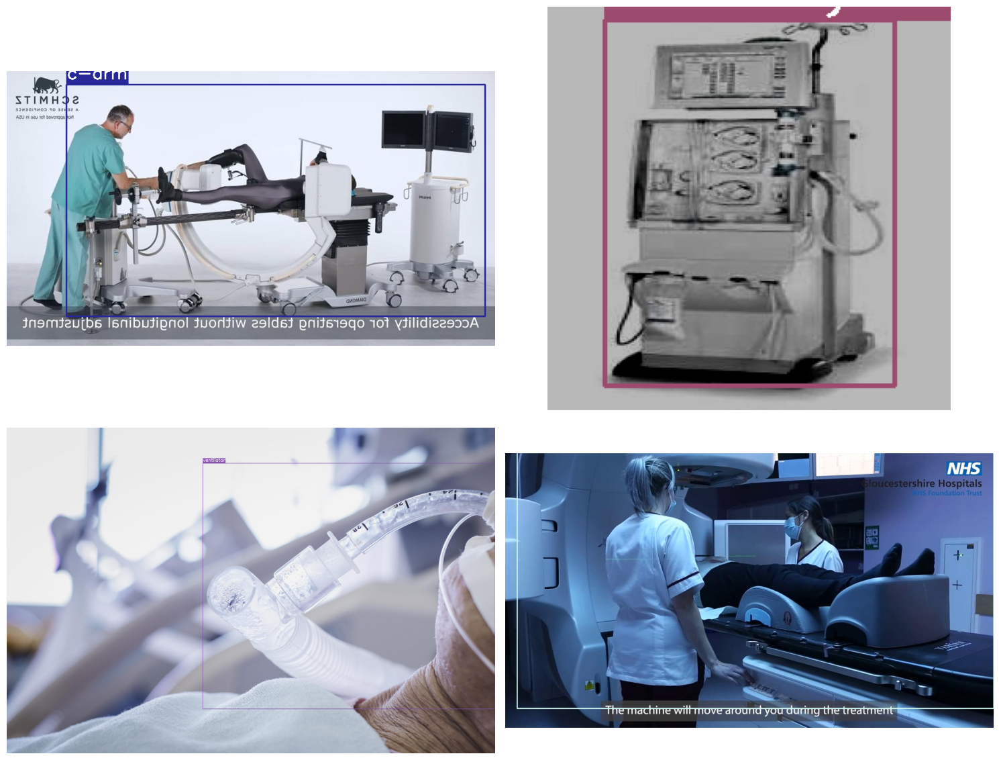

In [46]:
plot(
    image_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/images/*',
    label_paths='/kaggle/working/HospitalEquipmentDetection--7/train_aug/labels/*',
    num_samples=4,
)

# Clone YOLOv5 Repository

In [47]:
! git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16725, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 16725 (delta 12), reused 17 (delta 5), pack-reused 16679
Receiving objects: 100% (16725/16725), 15.31 MiB | 28.50 MiB/s, done.
Resolving deltas: 100% (11491/11491), done.


# Install Requirements

In [48]:
! pip install -r yolov5/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 58.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.7/793.7 kB 32.9 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.5.0
    Uninstalling Pillow-9.5.0:
      Successfully uninstalled Pillow-9.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.


In [49]:
print("Now we are ready to train yolov5 model")
! ls 

Now we are ready to train yolov5 model
HospitalEquipmentDetection--7  yolov5


In [50]:
%cd /kaggle/working/yolov5
!pwd

/kaggle/working/yolov5
/kaggle/working/yolov5


Here, we write the helper functions that we need for logging of the results in the notebook while training the models.

Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [51]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [52]:
TRAIN = True

## Create a data.yaml file with updated kaggle paths

In [53]:
import yaml
with open("data.yaml", "w") as file:
    yaml.dump({
        "train": "/kaggle/working/HospitalEquipmentDetection--7/train_aug/images",
        "val": "/kaggle/working/HospitalEquipmentDetection--7/val_aug/images",
        "nc": 18,
        "names": ['anesthesia-machine', 'c-arm', 'crash-cart', 'ct-scanner', 'defibrillators', 'ecg-machine', 'hemodialysis-machine', 'hospital-bed', 'infusion-pump', 'oxygen-concentrator', 'patient-monitor', 'radiotherapy-equipment', 'robotic-surgery-system', 'suction-machine', 'ultrsound-machine', 'ventilator', 'wheel-chair', 'x-ray-machine']
    }, stream=file, default_flow_style=None)

In [54]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data 'data.yaml' --weights yolov5s.pt \
    --img 640 --epochs 100 --name {RES_DIR} --patience 10

Current number of result directories: 0
results_1
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-07-02 17:02:56.427627: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-02 17:02:56.427756: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-02 17:02:56.564918: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout)

# Check Out the Validation Predictions and Inference

We will visualize the validation prediction images that are saved during training. The following is the function for that.

In [56]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

The following functions are for carrying out inference on images and videos.

In [57]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them.

In [58]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

F1_curve.png					  results.png
PR_curve.png					  train_batch0.jpg
P_curve.png					  train_batch1.jpg
R_curve.png					  train_batch2.jpg
confusion_matrix.png				  val_batch0_labels.jpg
events.out.tfevents.1719939818.717b444911b8.98.0  val_batch0_pred.jpg
hyp.yaml					  val_batch1_labels.jpg
labels.jpg					  val_batch1_pred.jpg
labels_correlogram.jpg				  val_batch2_labels.jpg
opt.yaml					  val_batch2_pred.jpg
results.csv					  weights
['runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg']


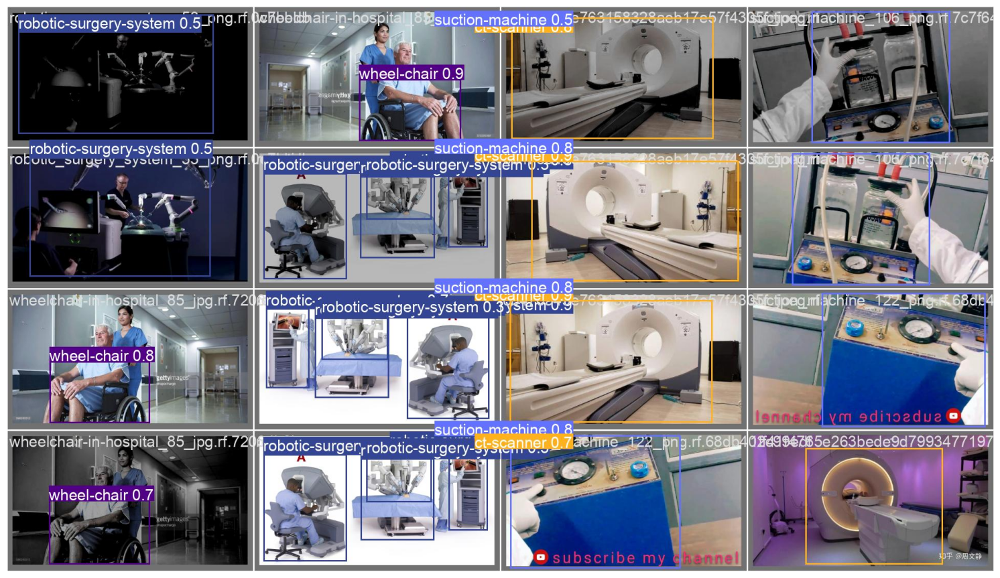

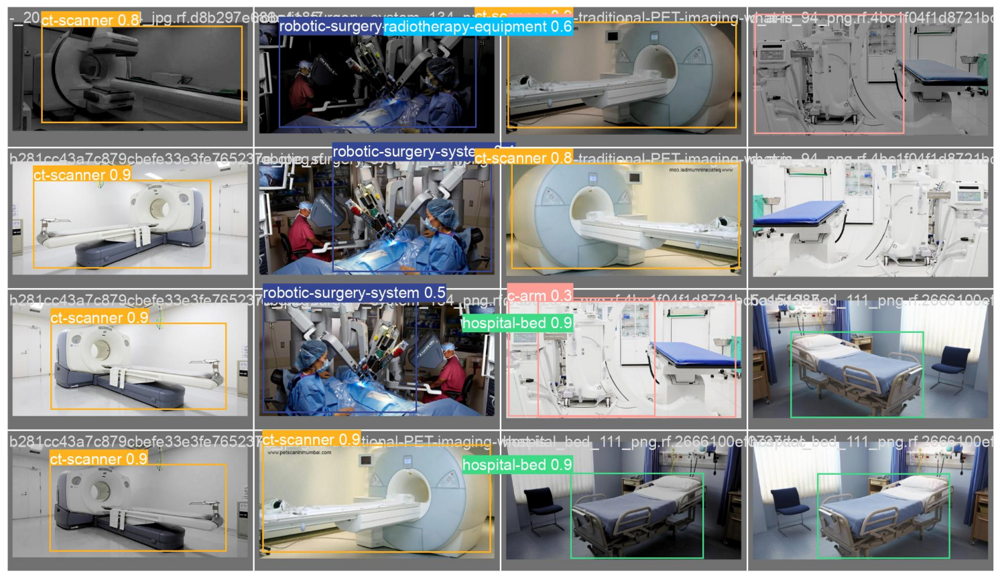

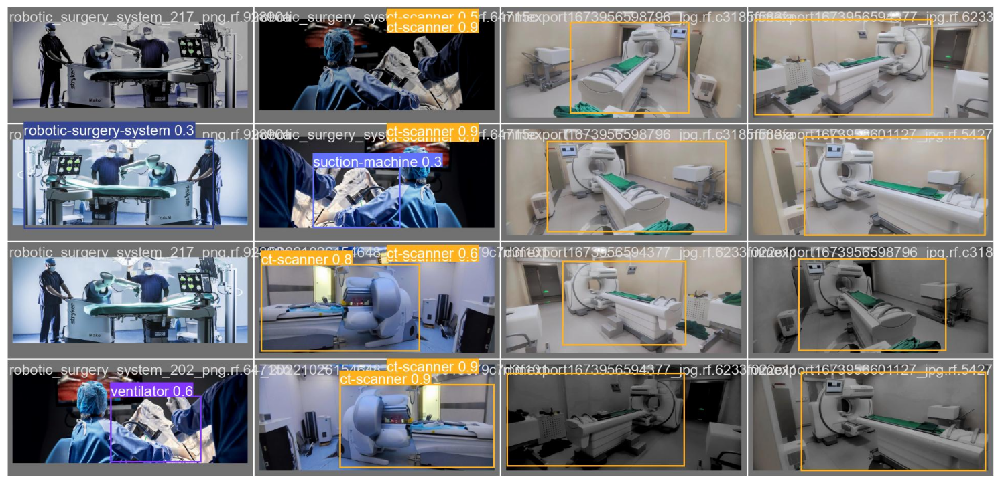

In [59]:
show_valid_results(RES_DIR)

# Inference on Images

To carry out inference on images, we just need to provide the directory path where all the images are stored, and inference will happen on all images automatically.

In [60]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://image.shutterstock.com/image-photo/disabled-child-on-wheelchair-playing-260nw-1542009176.jpg')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://image.shutterstock.com/image-photo/disabled-child-on-wheelchair-playing-260nw-1542009176.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
100%|██████████████████████████████████████| 43.0k/43.0k [00:00<00:00, 8.26MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/disabled-child-on-wheelchair-playing-260nw-154200

['runs/detect/inference_1/disabled-child-on-wheelchair-playing-260nw-1542009176.jpg']


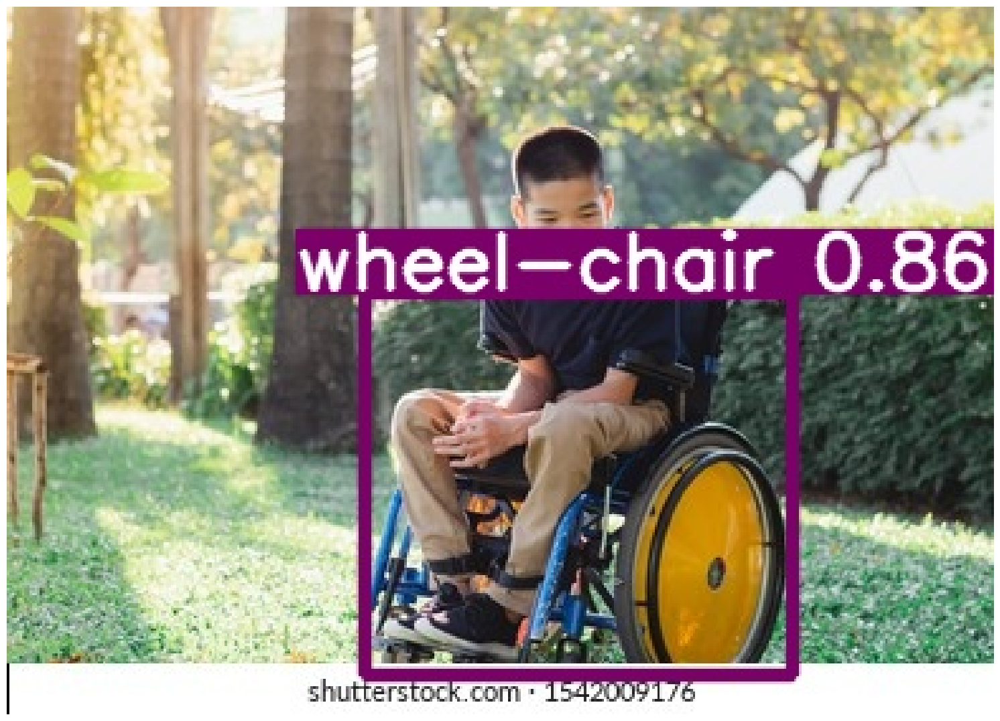

In [61]:
visualize(IMAGE_INFER_DIR)

In [62]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://c8.alamy.com/comp/C50F7K/hospital-nurses-moving-a-female-patient-in-her-bed-from-her-hospital-C50F7K.jpg')

Current number of inference detection directories: 1
inference_2
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://c8.alamy.com/comp/C50F7K/hospital-nurses-moving-a-female-patient-in-her-bed-from-her-hospital-C50F7K.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
158kB [00:00, 6.68MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/hospital-nurses-moving-a-female-patient-in-her-bed-from-her-hospital-C50F7K.jpg: 544x640 2 hos

['runs/detect/inference_2/hospital-nurses-moving-a-female-patient-in-her-bed-from-her-hospital-C50F7K.jpg']


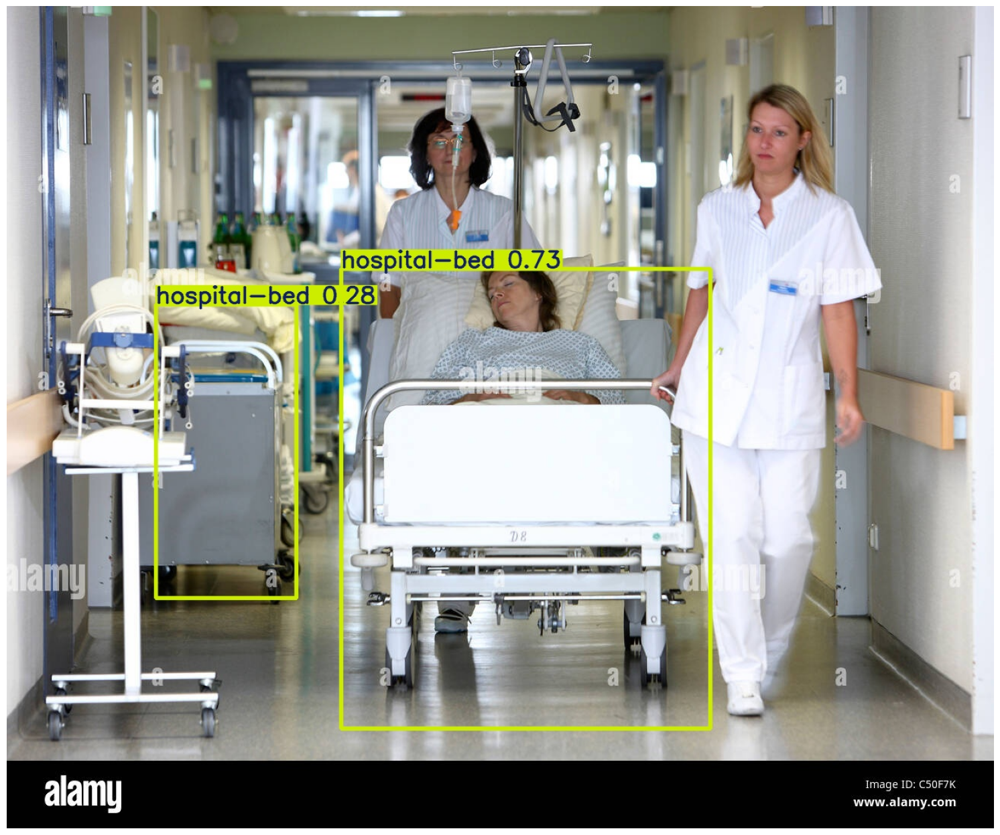

In [63]:
visualize(IMAGE_INFER_DIR)

In [64]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://c8.alamy.com/comp/C34DN6/two-nurses-moving-patients-bed-in-an-hospital-C34DN6.jpg')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://c8.alamy.com/comp/C34DN6/two-nurses-moving-patients-bed-in-an-hospital-C34DN6.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
156kB [00:00, 6.23MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/two-nurses-moving-patients-bed-in-an-hospital-C34DN6.jpg: 480x640 1 hospital-bed, 44.9ms
Speed: 0.5ms pre-process, 44

['runs/detect/inference_3/two-nurses-moving-patients-bed-in-an-hospital-C34DN6.jpg']


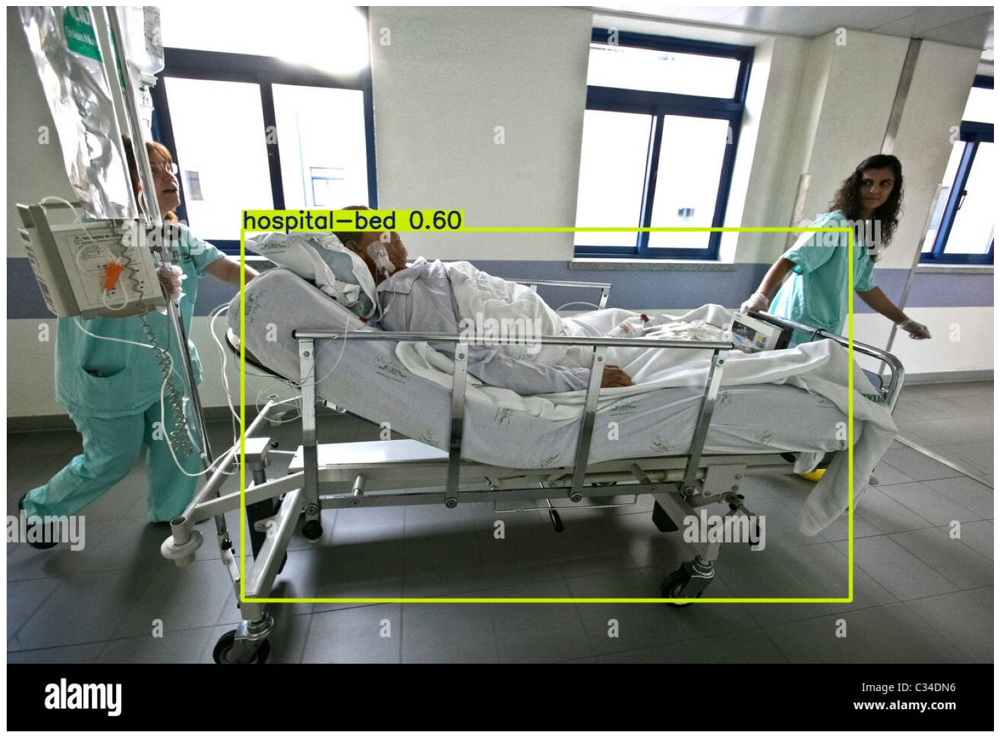

In [65]:
visualize(IMAGE_INFER_DIR)

In [66]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://image.shutterstock.com/image-photo/emergency-case-patient-on-bed-260nw-1976808269.jpg')

Current number of inference detection directories: 3
inference_4
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://image.shutterstock.com/image-photo/emergency-case-patient-on-bed-260nw-1976808269.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_4, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
100%|██████████████████████████████████████| 24.6k/24.6k [00:00<00:00, 18.5MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/emergency-case-patient-on-bed-260nw-1976808269.jpg: 480x

['runs/detect/inference_4/emergency-case-patient-on-bed-260nw-1976808269.jpg']


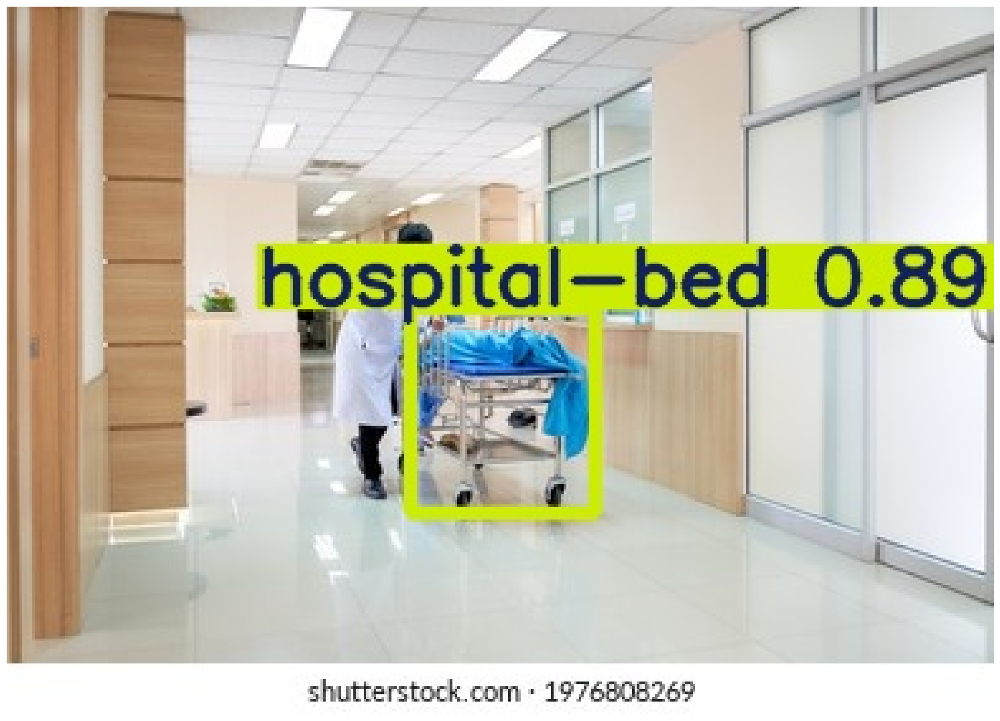

In [67]:
visualize(IMAGE_INFER_DIR)

In [68]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://www.braunability.eu/contentassets/2c04a37aa6cd4af08b0d87f41c6f339c/turnyevo_transfer_400x250.jpg')

Current number of inference detection directories: 4
inference_5
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://www.braunability.eu/contentassets/2c04a37aa6cd4af08b0d87f41c6f339c/turnyevo_transfer_400x250.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_5, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
100%|██████████████████████████████████████| 43.2k/43.2k [00:00<00:00, 7.59MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/turnyevo_transfer_400x250.jpg: 416x640 (no de

['runs/detect/inference_5/turnyevo_transfer_400x250.jpg']


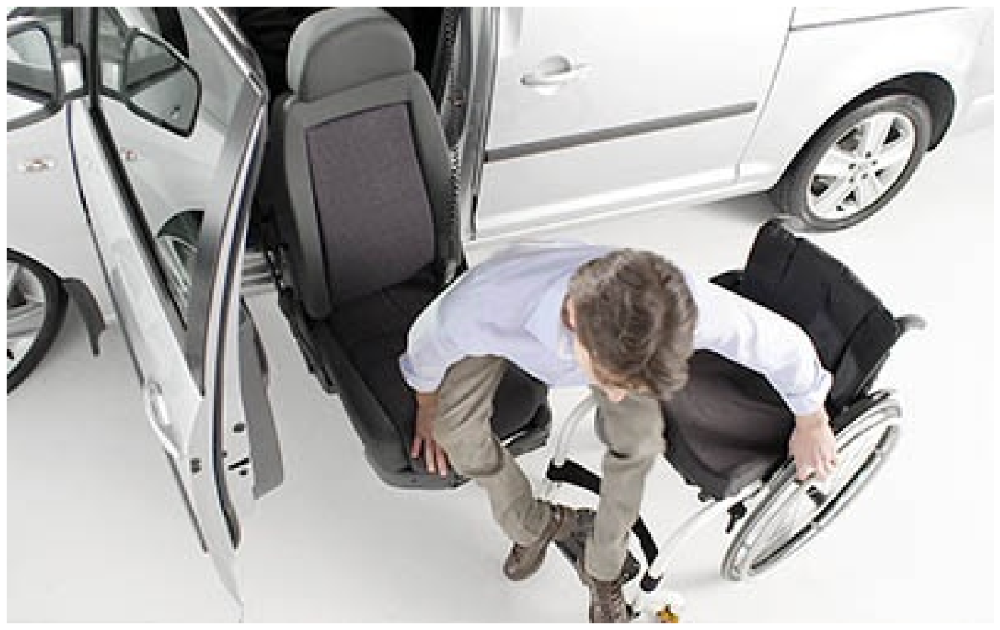

In [69]:
visualize(IMAGE_INFER_DIR)

In [71]:
IMAGE_INFER_DIR = inference(RES_DIR, 'https://patch.com/img/cdn/users/2213323/2015/11/raw/2015115654b48165c45.jpg')

Current number of inference detection directories: 6
inference_7
detect: weights=['runs/train/results_1/weights/best.pt'], source=https://patch.com/img/cdn/users/2213323/2015/11/raw/2015115654b48165c45.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_7, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
100%|████████████████████████████████████████| 252k/252k [00:00<00:00, 11.6MB/s]
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
Model summary: 157 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /kaggle/working/yolov5/2015115654b48165c45.jpg: 448x640 2 hospital-beds, 45.5ms
Speed: 0.6ms pre-

['runs/detect/inference_7/2015115654b48165c45.jpg']


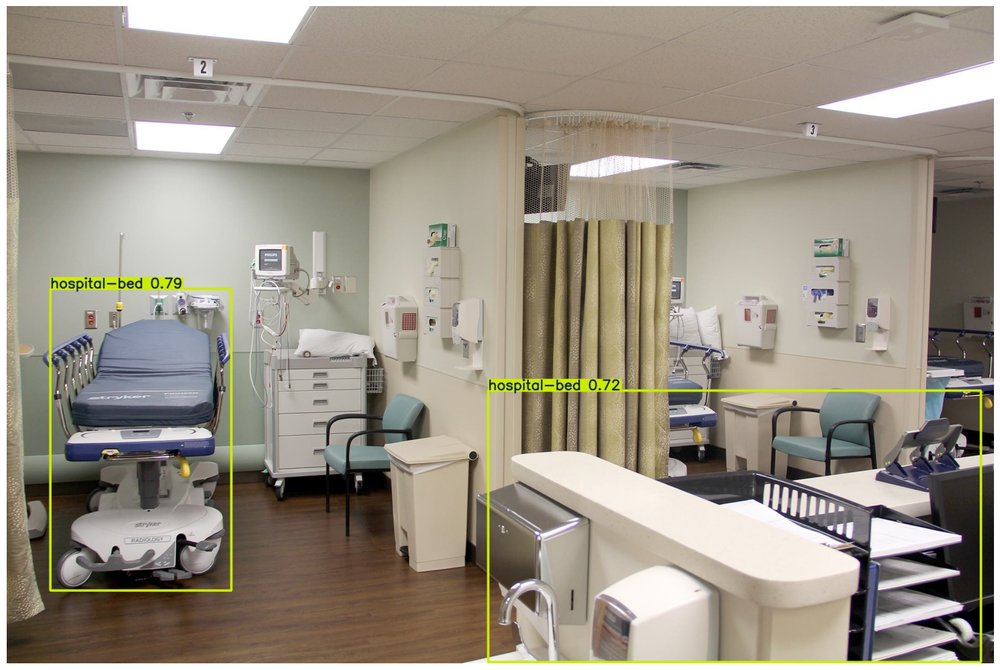

In [72]:
visualize(IMAGE_INFER_DIR)